## Assignment Day 11  | July 20


#### Question:
Find the correlation of Attrition variable with all other variables in the dataset

#### Problem Statement:

A large company named XYZ, employs, at any given point of time, around 4000 employees. However, every year, around 15% of its employees leave the company and need to be replaced with the talent pool available in the job market. The management believes that this level of attrition (employees leaving, either on their own or because they got fired) is bad for the company, because of the following reasons -

The former employees projects get delayed, which makes it difficult to meet timelines, resulting in a reputation loss among consumers and partners
A sizeable department has to be maintained, for the purposes of recruiting new talent
More often than not, the new employees have to be trained for the job and/or given time to acclimatise themselves to the company

Hence, the management has contracted an HR analytics firm to understand what factors they should focus on, in order to curb attrition. In other words, they want to know what changes they should make to their workplace, in order to get most of their employees to stay. Also, they want to know which of these variables is most important and needs to be addressed right away.

Since you are one of the star analysts at the firm, this project has been given to you.

Goal of the case study You are required to model the probability of attrition. The results thus obtained will be used by the management to understand what changes they should make to their workplace, in order to get most of their employees to stay.




In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import itertools
import scipy.stats as stats
from scipy.stats import ttest_1samp, ttest_ind,mannwhitneyu,levene,shapiro,wilcoxon
from statsmodels.stats.power import ttest_power
from scipy.stats import linregress
import warnings
warnings.filterwarnings('ignore')

# to visualise al the columns in the dataframe
pd.pandas.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('general_data.csv')
map_attrition = {'Yes': 1, 'No': 0}   # Convert the categorical object into numerical
map_gender = {'Male': 1, 'Female': 0} 
df = df.replace({'Attrition': map_attrition})
df = df.replace({'Gender': map_gender})
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,0,Travel_Rarely,Sales,6,2,Life Sciences,1,1,0,1,Healthcare Representative,Married,131160,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,1,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,0,1,Research Scientist,Single,41890,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,0,Travel_Frequently,Research & Development,17,4,Other,1,3,1,4,Sales Executive,Married,193280,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,0,Non-Travel,Research & Development,2,5,Life Sciences,1,4,1,3,Human Resources,Married,83210,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,0,Travel_Rarely,Research & Development,10,1,Medical,1,5,1,1,Sales Executive,Single,23420,4.0,Y,12,8,2,9.0,2,6,0,4


In [3]:
df.drop(labels=['EmployeeID','EmployeeCount','StandardHours','Over18'],axis = 1,inplace=True)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   Attrition                4410 non-null   int64  
 2   BusinessTravel           4410 non-null   object 
 3   Department               4410 non-null   object 
 4   DistanceFromHome         4410 non-null   int64  
 5   Education                4410 non-null   int64  
 6   EducationField           4410 non-null   object 
 7   Gender                   4410 non-null   int64  
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   int64  
 12  NumCompaniesWorked       4391 non-null   float64
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [5]:
pfr = ProfileReport(df, title="Attrition EDA")
pfr.to_file(output_file="Attrition Data Profiling.html")
pfr

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,4410.0,36.923810,9.133301,18.0,30.0,36.0,43.0,60.0
Attrition,4410.0,0.161224,0.367780,0.0,0.0,0.0,0.0,1.0
DistanceFromHome,4410.0,9.192517,8.105026,1.0,2.0,7.0,14.0,29.0
Education,4410.0,2.912925,1.023933,1.0,2.0,3.0,4.0,5.0
Gender,4410.0,0.600000,0.489954,0.0,0.0,1.0,1.0,1.0
JobLevel,4410.0,2.063946,1.106689,1.0,1.0,2.0,3.0,5.0
MonthlyIncome,4410.0,65029.312925,47068.888559,10090.0,29110.0,49190.0,83800.0,199990.0
NumCompaniesWorked,4391.0,2.694830,2.498887,0.0,1.0,2.0,4.0,9.0
PercentSalaryHike,4410.0,15.209524,3.659108,11.0,12.0,14.0,18.0,25.0
StockOptionLevel,4410.0,0.793878,0.851883,0.0,0.0,1.0,1.0,3.0


In [7]:
# Let us look at the target column which is 'Attrition' to understand how the data is distributed amongst the various values
df.groupby(["Attrition"]).count()

,Age,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,,,,,,,,,,,,,,,,,,,
0,3699,3699,3699,3699,3699,3699,3699,3699,3699,3699,3699,3684,3699,3699,3692,3699,3699,3699,3699
1,711,711,711,711,711,711,711,711,711,711,711,707,711,711,709,711,711,711,711


<AxesSubplot:xlabel='Attrition', ylabel='count'>

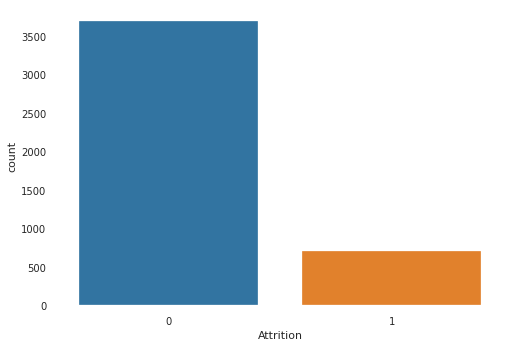

In [8]:
sns.countplot(x='Attrition', data=df)

In [9]:
#missing data => Find total rows having missing values and calculate the percentage of missing values for each field.
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
NumCompaniesWorked,19,0.004308
TotalWorkingYears,9,0.002041
YearsWithCurrManager,0,0.000000
JobLevel,0,0.000000
Attrition,0,0.000000
BusinessTravel,0,0.000000
Department,0,0.000000
DistanceFromHome,0,0.000000
Education,0,0.000000
EducationField,0,0.000000


In [10]:
#Let us drop the na values as they are minimal here 
df.dropna(inplace=True)


In [11]:
#missing data => Find total rows having missing values and calculate the percentage of missing values for each field.
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
YearsWithCurrManager,0,0.0
YearsSinceLastPromotion,0,0.0
Attrition,0,0.0
BusinessTravel,0,0.0
Department,0,0.0
DistanceFromHome,0,0.0
Education,0,0.0
EducationField,0,0.0
Gender,0,0.0
JobLevel,0,0.0


In [12]:
vars_num = list(df.select_dtypes([np.number]).columns) # List of Numerical Columns

In [13]:
vars_num

['Age',
 'Attrition',
 'DistanceFromHome',
 'Education',
 'Gender',
 'JobLevel',
 'MonthlyIncome',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

<Figure size 576x396 with 0 Axes>

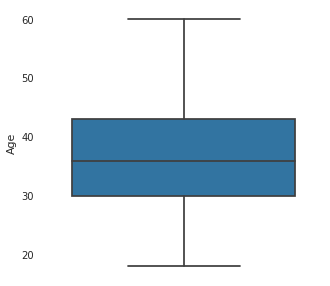

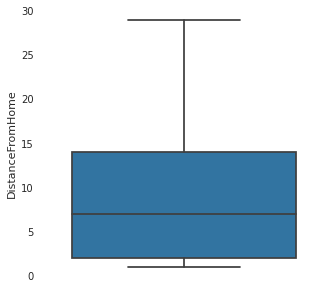

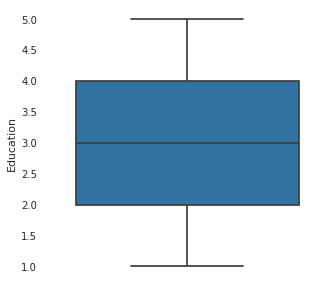

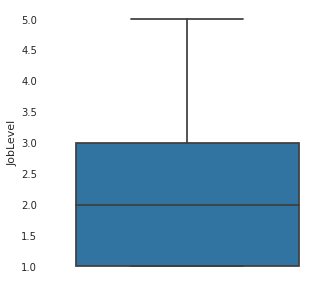

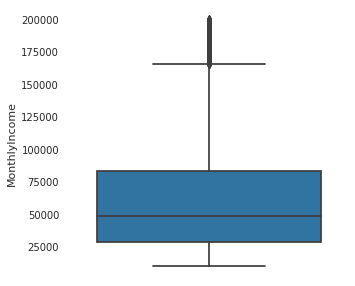

...

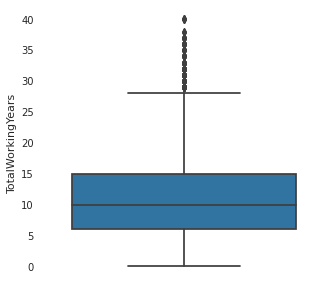

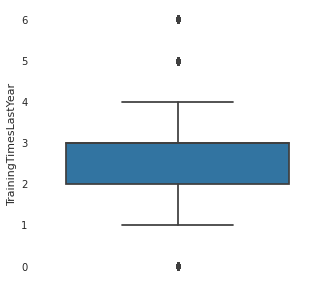

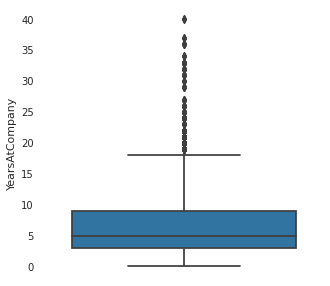

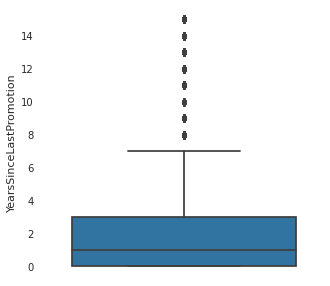

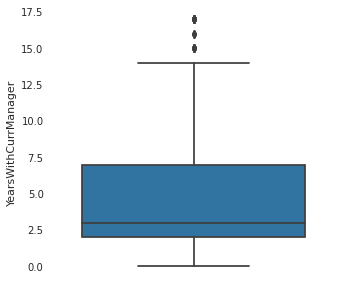

In [14]:
fig = plt.figure()

for var in vars_num:
    if (var != 'Attrition' and var != 'Gender'):
        fig = plt.figure(figsize =(5, 5))
        sns.boxplot(y=df[var],orient="v")
        

<AxesSubplot:>

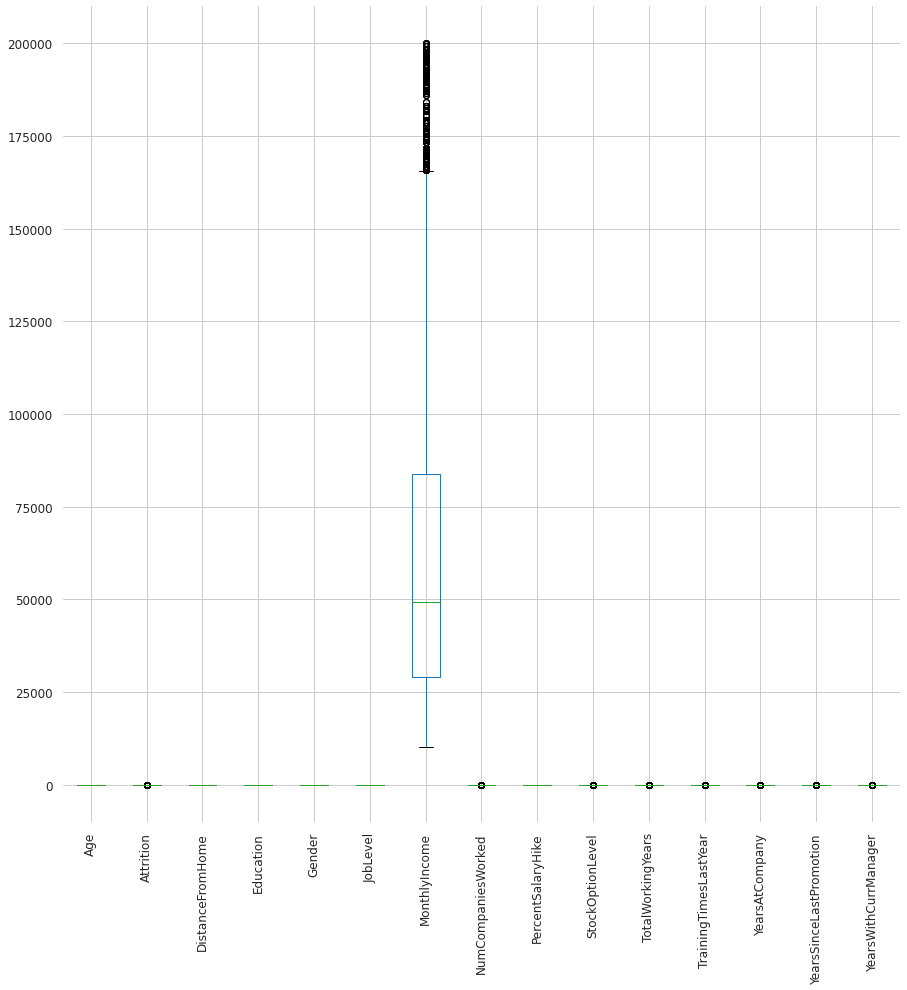

In [15]:
df.boxplot(rot=90,figsize=(15,15),fontsize='large')

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Attrition'}>,
        <AxesSubplot:title={'center':'DistanceFromHome'}>,
        <AxesSubplot:title={'center':'Education'}>],
       [<AxesSubplot:title={'center':'Gender'}>,
        <AxesSubplot:title={'center':'JobLevel'}>,
        <AxesSubplot:title={'center':'MonthlyIncome'}>,
        <AxesSubplot:title={'center':'NumCompaniesWorked'}>],
       [<AxesSubplot:title={'center':'PercentSalaryHike'}>,
        <AxesSubplot:title={'center':'StockOptionLevel'}>,
        <AxesSubplot:title={'center':'TotalWorkingYears'}>,
        <AxesSubplot:title={'center':'TrainingTimesLastYear'}>],
       [<AxesSubplot:title={'center':'YearsAtCompany'}>,
        <AxesSubplot:title={'center':'YearsSinceLastPromotion'}>,
        <AxesSubplot:title={'center':'YearsWithCurrManager'}>,
        <AxesSubplot:>]], dtype=object)

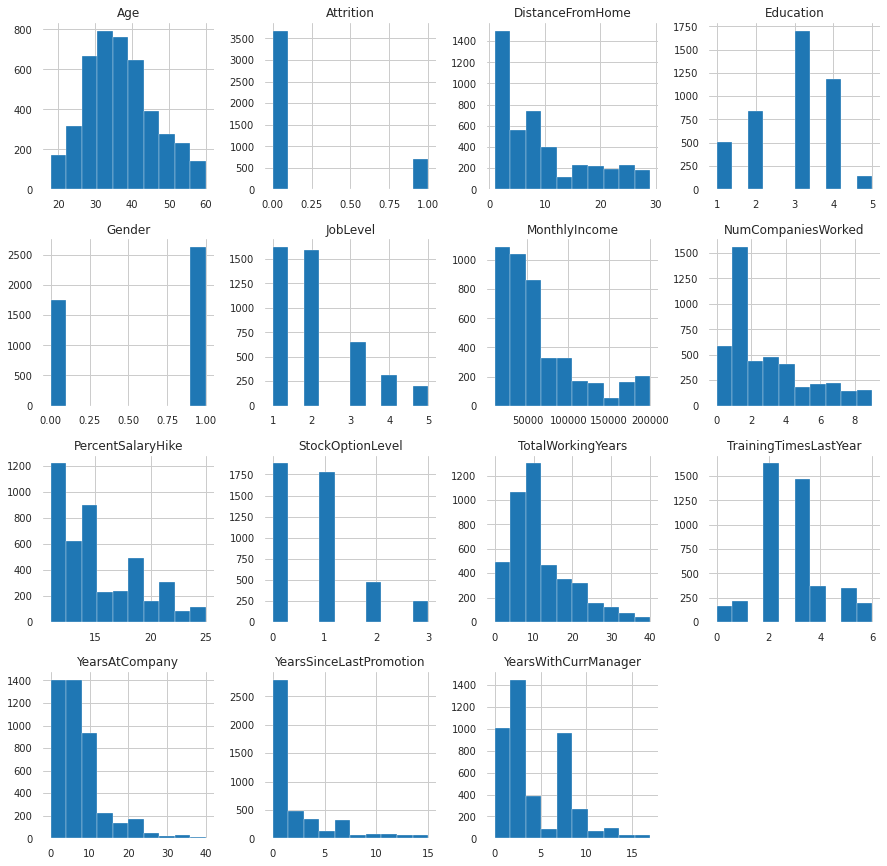

In [16]:
df.hist(figsize=(15,15))

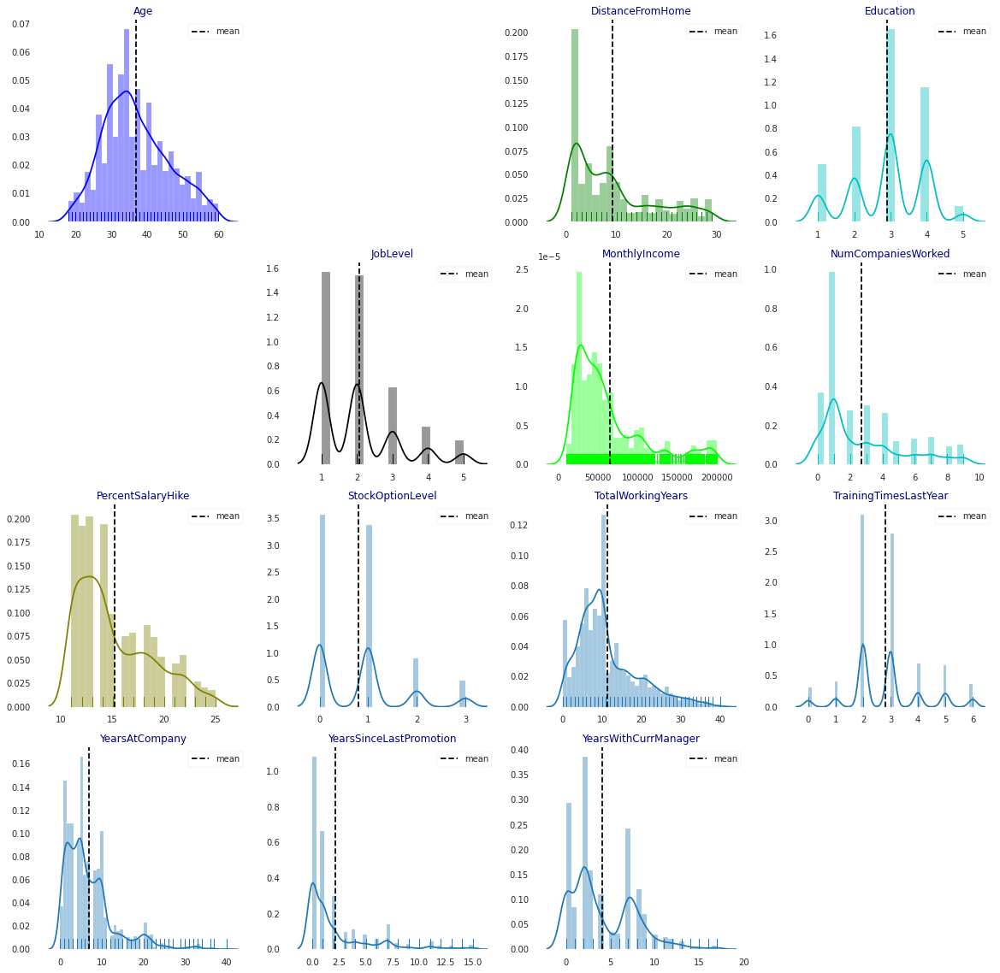

In [17]:
cols = vars_num
length = len(cols)
cs = ["b","r","g","c","m","k","lime","c","olive"]
fig = plt.figure(figsize=(20,20))

for i,j,k in itertools.zip_longest(cols,range(length),cs):
    if (i != 'Attrition' and i != 'Gender'):
        plt.subplot(4,4,j+1)
        ax = sns.distplot(df[i],color=k,rug=True)
        ax.set_facecolor("w")
        plt.axvline(df[i].mean(),linestyle="dashed",label="mean",color="k")
        plt.legend(loc="best")
        plt.title(i,color="navy")
        plt.xlabel("")

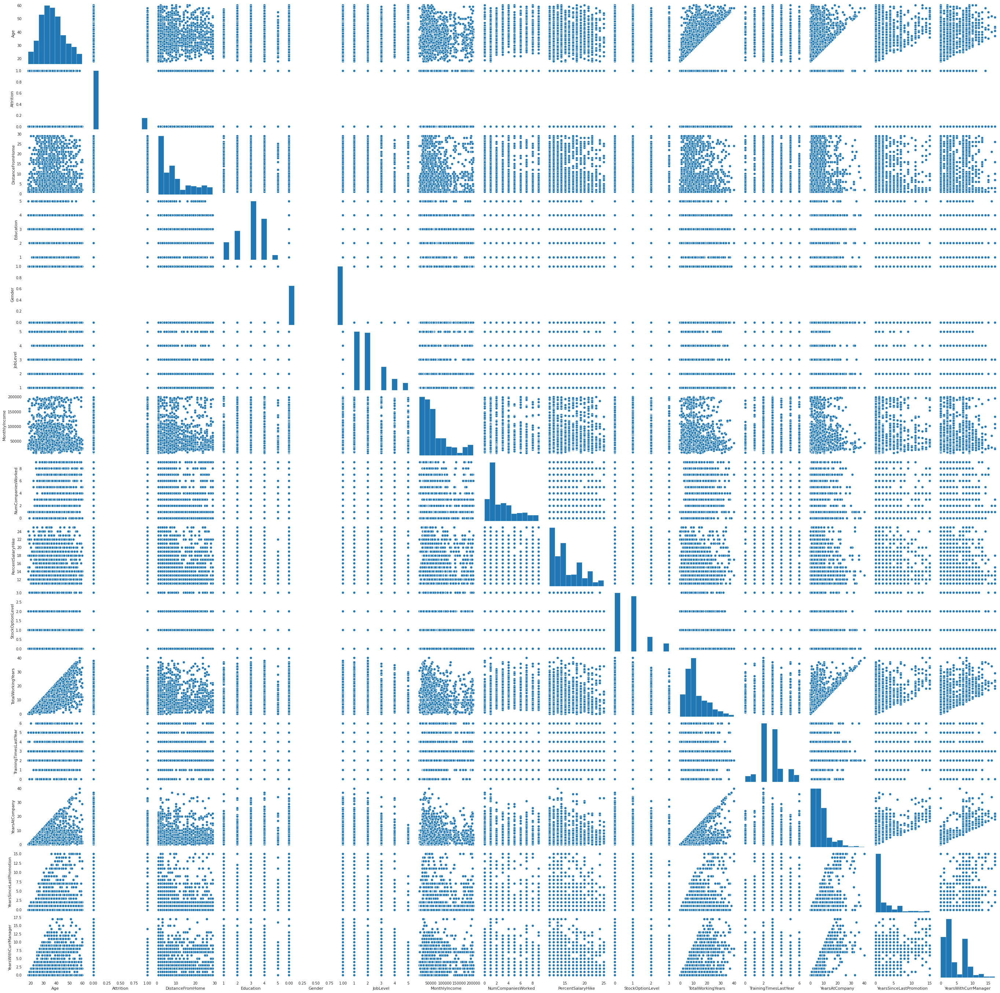

In [18]:

# Let us do a bivariate analysis with pair plot

sns.pairplot(df[vars_num],diag_kind='auto')

In [19]:
corr_mat = df[vars_num].corr()
corr_mat

,Age,Attrition,DistanceFromHome,Education,Gender,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.158399,0.007376,-0.033900,-0.040625,-0.001137,-0.045163,0.299527,-0.032561,-0.031504,0.680037,-0.028962,0.311281,0.215650,0.201580
Attrition,-0.158399,1.000000,-0.009449,-0.017106,0.018396,-0.012382,-0.030160,0.042831,0.033153,-0.008164,-0.169670,-0.047586,-0.133003,-0.031423,-0.154692
DistanceFromHome,0.007376,-0.009449,1.000000,-0.007491,-0.042610,-0.039990,-0.022757,-0.014449,0.037720,0.009353,0.009574,-0.008957,0.030746,0.002243,0.021773
Education,-0.033900,-0.017106,-0.007491,1.000000,-0.017671,0.045822,0.007289,-0.016210,-0.041054,0.002386,-0.009228,0.009939,0.005997,0.023457,0.005645
Gender,-0.040625,0.018396,-0.042610,-0.017671,1.000000,-0.026019,0.006805,-0.066860,0.013207,0.022043,-0.028251,-0.032597,-0.018659,-0.023018,0.002688
JobLevel,-0.001137,-0.012382,-0.039990,0.045822,-0.026019,1.000000,0.046688,-0.009759,0.010874,0.000365,-0.036293,-0.031931,-0.063360,-0.059680,-0.053898
MonthlyIncome,-0.045163,-0.030160,-0.022757,0.007289,0.006805,0.046688,1.000000,-0.021446,0.004607,0.027242,-0.034398,0.049780,0.000088,0.064470,0.023095
NumCompaniesWorked,0.299527,0.042831,-0.014449,-0.016210,-0.066860,-0.009759,-0.021446,1.000000,0.030064,0.016291,0.238807,-0.031335,-0.117213,-0.035855,-0.109372
PercentSalaryHike,-0.032561,0.033153,0.037720,-0.041054,0.013207,0.010874,0.004607,0.030064,1.000000,0.012104,-0.018480,-0.036720,-0.029022,-0.028654,-0.039687
StockOptionLevel,-0.031504,-0.008164,0.009353,0.002386,0.022043,0.000365,0.027242,0.016291,0.012104,1.000000,0.003138,-0.068028,0.009369,0.019889,0.019398


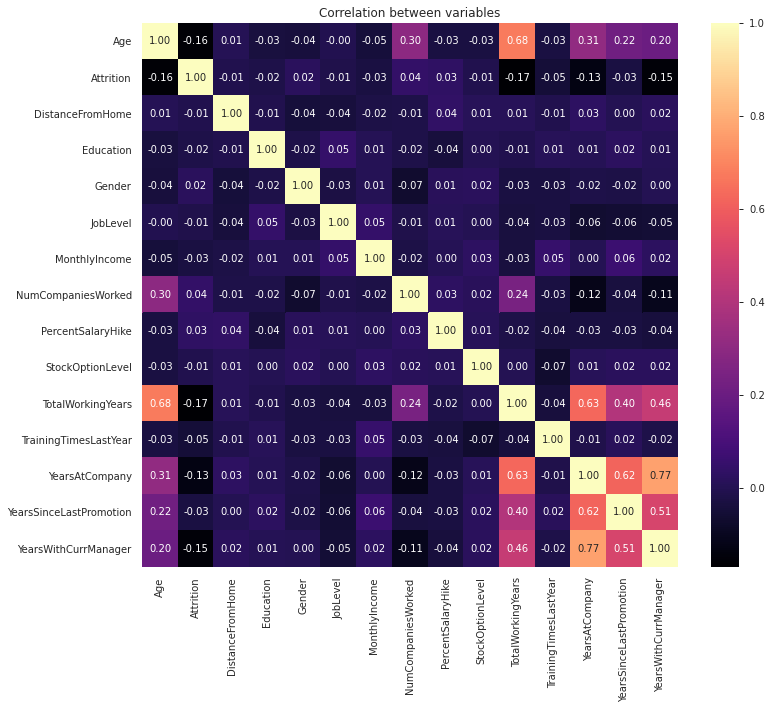

In [20]:
plt.figure(figsize=(12,10))
with sns.axes_style("darkgrid"):
    sns.heatmap(corr_mat,cmap='magma', annot=True,fmt='.2f') 
plt.title("Correlation between variables")
plt.show()

**Attrition With Age**

Null Hypothesis H0 -> There is no significant difference in people's Age with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's Age with the people either with Attrition Yes or Attrition as No

In [21]:
LinregressResult = linregress(df[df['Attrition'] == 1]['Age'].sample(n=700),df[df['Attrition'] == 0]['Age'].sample(n=700))
print(LinregressResult)

LinregressResult(slope=-0.022590404869666215, intercept=38.41183020246402, rvalue=-0.024058529304086675, pvalue=0.5251132917472139, stderr=0.03553051510711364)


In [22]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['Age'].sample(n=700),
                                       df[df['Attrition'] == 0]['Age'].sample(n=700)) 
#define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

Pearson Correlation Coefficient:  0.011079966118848983 and a P-value of: 0.769802364636348


In [23]:
if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With Distance From Home**

Null Hypothesis H0 -> There is no significant difference in people's Distance from their Home with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's Distance from their Home with the people either with Attrition Yes or Attrition as No

In [24]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['DistanceFromHome'].sample(n=700)
                                       ,df[df['Attrition'] == 0]['DistanceFromHome'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

Pearson Correlation Coefficient:  0.013516531154859285 and a P-value of: 0.7210985531785746


**Attrition With MonthlyIncome**

Null Hypothesis H0 -> There is no significant difference in people's MonthlyIncome with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's MonthlyIncome with the people either with Attrition Yes or Attrition as No


In [25]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  -0.02376429393515641 and a P-value of: 0.5301945321563251
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With PercentSalaryHike**

Null Hypothesis H0 -> There is no significant difference in people's PercentSalaryHike with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's PercentSalaryHike with the people either with Attrition Yes or Attrition as No


In [26]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['PercentSalaryHike'].sample(n=700),
                                       df[df['Attrition'] == 0]['PercentSalaryHike'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  -0.04133936120791016 and a P-value of: 0.27472370561348886
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With YearsAtCompany**

Null Hypothesis H0 -> There is no significant difference in people's YearsAtCompany with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's YearsAtCompany with the people either with Attrition Yes or Attrition as No


In [27]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['YearsAtCompany'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsAtCompany'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  0.027851687313227243 and a P-value of: 0.4619058899174093
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With YearsSinceLastPromotion**

Null Hypothesis H0 -> There is no significant difference in people's YearsSinceLastPromotion with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's YearsSinceLastPromotion with the people either with Attrition Yes or Attrition as No


In [28]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['YearsSinceLastPromotion'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsSinceLastPromotion'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  0.04928708860244496 and a P-value of: 0.19275408072105962
We reject our Null hypothesis and proceed with our Alternate hypothesis


In [29]:
if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

We reject our Null hypothesis and proceed with our Alternate hypothesis


In [30]:
df[df.columns[0:]].corr()['Attrition'][:]

Age                       -0.158399
Attrition                  1.000000
DistanceFromHome          -0.009449
Education                 -0.017106
Gender                     0.018396
JobLevel                  -0.012382
MonthlyIncome             -0.030160
NumCompaniesWorked         0.042831
PercentSalaryHike          0.033153
StockOptionLevel          -0.008164
TotalWorkingYears         -0.169670
TrainingTimesLastYear     -0.047586
YearsAtCompany            -0.133003
YearsSinceLastPromotion   -0.031423
YearsWithCurrManager      -0.154692
Name: Attrition, dtype: float64

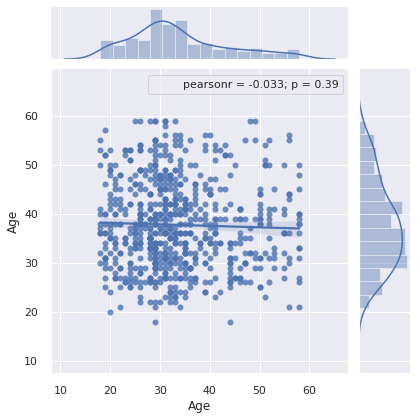

In [31]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['Age'].sample(n=700),
                                       df[df['Attrition'] == 0]['Age'].sample(n=700),
              data=df,kind="reg",color='b').annotate(stats.pearsonr)
plt.show()

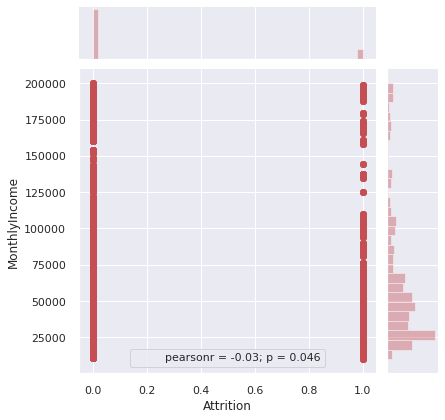

In [32]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot('Attrition','MonthlyIncome',data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

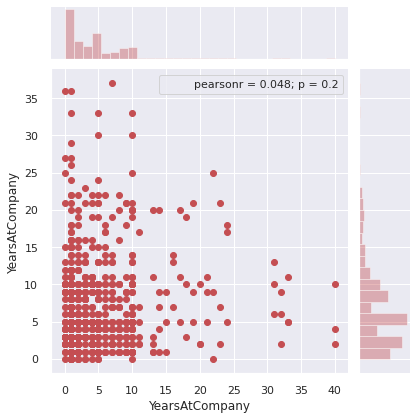

In [33]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsAtCompany'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsAtCompany'].sample(n=700),data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

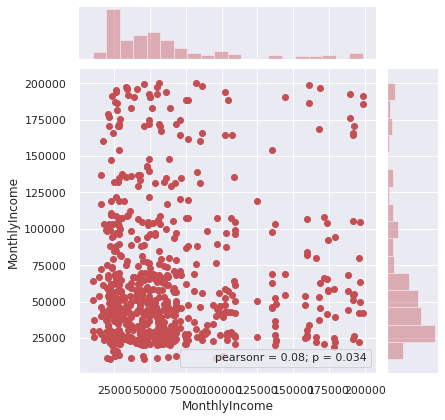

In [34]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700)
              ,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

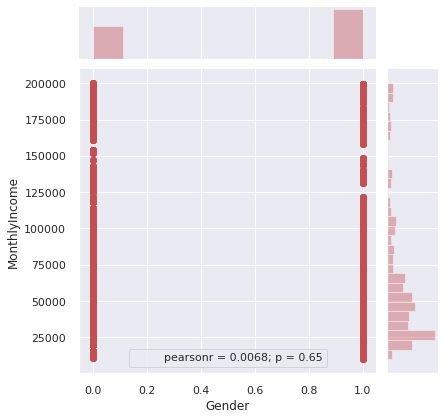

In [35]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot('Gender','MonthlyIncome',data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

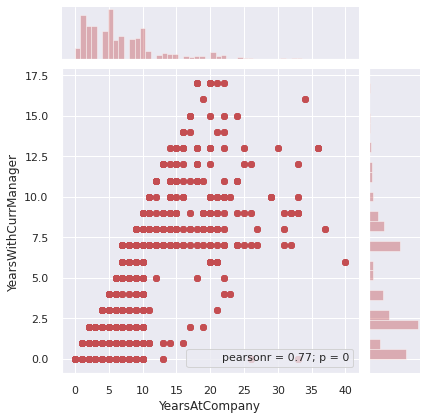

In [36]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot('YearsAtCompany','YearsWithCurrManager',data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

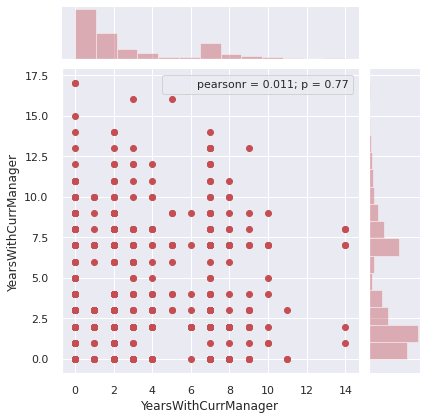

In [37]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsWithCurrManager'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsWithCurrManager'].sample(n=700),data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

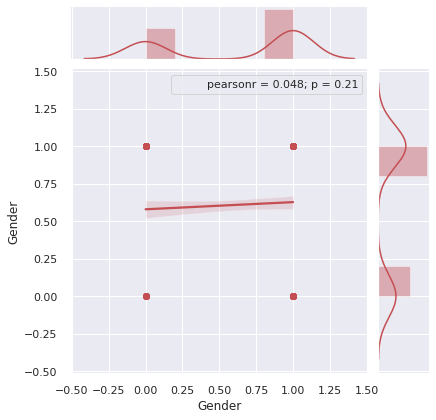

In [38]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['Gender'].sample(n=700),
                                       df[df['Attrition'] == 0]['Gender'].sample(n=700),
              data=df,kind="reg",color='r').annotate(stats.pearsonr)
plt.show()

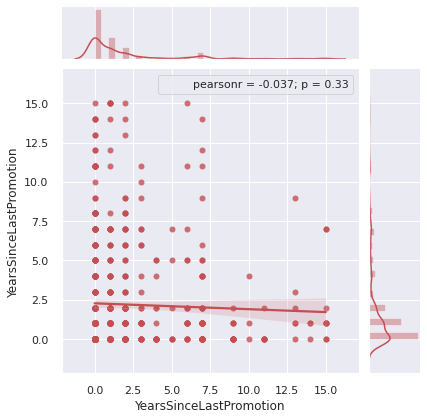

In [39]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsSinceLastPromotion'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsSinceLastPromotion'].sample(n=700),
              data=df,kind="reg",color='r').annotate(stats.pearsonr)
plt.show()